# **Project Title**:  An Exploratory Analysis of India’s Foreign Trade

# **Group Members** 
### **a) Name and NetID of each member**  
 Praxal Patel - psp334, Dhara Mungra - dam797, Anjali Agrawal -aa7513
### **b) Member responsible for uploading submissions**
 Praxal Patel - psp334


<h2> Importing Necessary Libraries</h2>

In [3]:
import pandas as pd
import numpy as np 
'''Ignore deprecation and future, and user warnings.'''
import warnings as wrn
wrn.filterwarnings('ignore', category = DeprecationWarning) 
wrn.filterwarnings('ignore', category = FutureWarning) 
wrn.filterwarnings('ignore', category = UserWarning) 
wrn.filterwarnings('ignore')
'''Import basic modules.'''
import pandas as pd
import numpy as np
from scipy import stats

'''Customize visualization
Seaborn and matplotlib visualization.'''
import matplotlib.pyplot as plt
import seaborn as sns                   
sns.set_style("whitegrid") 
import pycountry
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML

'''Plotly visualization .'''
import plotly.offline as py
from plotly.offline import iplot, init_notebook_mode
import plotly.graph_objs as go
init_notebook_mode(connected = True) # Required to use plotly offline in jupyter notebook

'''Display markdown formatted output like bold, italic bold etc.'''
from IPython.display import Markdown
def bold(string):
    display(Markdown(string))

<h2> Data Collection </h2>

Data for export as well as import has been collected by webscraping with the help of Python libraries. The code for the same is in the python notebook- Scraping Export Data and Scraping Import Data. After scraping the data, we load the data into pandas dataframe as it provides an easy way for analysing the data. 

In [4]:
df_import= pd.read_csv("all_import.csv")
df_export= pd.read_csv("india_export.csv")
df_import=df_import.drop(columns=['Unnamed: 0','Unnamed: 0.1'])

In [5]:
def data_understanding(df):
    print("The size of the data is: \n",df.shape)
    print("******")
    print("The descriptive statistical measures for the data is :\n",df.describe())
    print("******")
bold('**Data Description of export dataset:**')
display(data_understanding(df_export))

bold('**Data Description of import dataset:**')
display(data_understanding(df_import))

**Data Description of export dataset:**

The size of the data is: 
 (327016, 5)
******
The descriptive statistical measures for the data is :
               HSCode          value           year
count  327016.000000  290087.000000  327016.000000
mean       51.318281      13.733625    2008.447036
std        27.957777     164.961345       6.668336
min         1.000000       0.000000    1997.000000
25%        28.000000       0.020000    2003.000000
50%        52.000000       0.220000    2009.000000
75%        74.000000       2.170000    2014.000000
max        99.000000   19805.170000    2019.000000
******


None

**Data Description of import dataset:**

The size of the data is: 
 (355834, 5)
******
The descriptive statistical measures for the data is :
               HSCode          value           year
count  355834.000000  300327.000000  355834.000000
mean       53.928306      39.810326    2008.415171
std        27.465096     496.180176       6.698292
min         1.000000       0.000000    1997.000000
25%        31.000000       0.020000    2003.000000
50%        54.000000       0.250000    2009.000000
75%        78.000000       2.950000    2014.000000
max        99.000000   32781.570000    2019.000000
******


None

In [6]:
'''Variable Description'''
def description(df):
    summary = pd.DataFrame(df.dtypes,columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing'] = df.isnull().sum().values    
    summary['Uniques'] = df.nunique().values
    summary['Duplicates']=str(df.duplicated().sum())
    summary['First Value'] = df.loc[0].values
    summary['Second Value'] = df.loc[1].values
    summary['Third Value'] = df.loc[2].values
    return summary
bold('**Variable Description of export dataset:**')
display(description(df_export))

bold('**Variable Description of import dataset:**')
display(description(df_import))

**Variable Description of export dataset:**

,Name,dtypes,Missing,Uniques,Duplicates,First Value,Second Value,Third Value
0,HSCode,int64,0,98,8558,4,6,7
1,Commodity,object,0,98,8558,DAIRY PRODUCE; BIRDS' EGGS; NATURAL HONEY; EDI...,LIVE TREES AND OTHER PLANTS; BULBS; ROOTS AND ...,EDIBLE VEGETABLES AND CERTAIN ROOTS AND TUBERS.
2,value,float64,36929,13635,8558,0,0.02,0.01
3,country,object,0,249,8558,AFGHANISTAN TIS,AFGHANISTAN TIS,AFGHANISTAN TIS
4,year,int64,0,23,8558,1997,1997,1997


**Variable Description of import dataset:**

,Name,dtypes,Missing,Uniques,Duplicates,First Value,Second Value,Third Value
0,Commodity,object,0,98,186463,"PRODUCTS OF ANIMAL ORIGIN, NOT ELSEWHERE SPECI...",EDIBLE FRUIT AND NUTS; PEEL OR CITRUS FRUIT OR...,"COFFEE, TEA, MATE AND SPICES."
1,HSCode,int64,0,98,186463,5,8,9
2,country,object,0,245,186463,AFGHANISTAN TIS,AFGHANISTAN TIS,AFGHANISTAN TIS
3,value,float64,55507,12543,186463,0,7.11,0.6
4,year,int64,0,23,186463,1997,1997,1997


In [7]:
def unspecified_countries(df):
    missing_country=df[df.country == "UNSPECIFIED"]
    print("The number of unspecified countries in the data: ",missing_country.shape[0]) 
bold('**Unspecified Countries of export dataset:**')
display(unspecified_countries(df_export))

bold('**Unspecified Countries of import dataset:**')
display(unspecified_countries(df_import))

**Unspecified Countries of export dataset:**

The number of unspecified countries in the data:  1565


None

**Unspecified Countries of import dataset:**

The number of unspecified countries in the data:  3510


None

There are lot of imports/exports that are unspecified. This can be due to imports related to defense or maybe other factors for which they have unspecifed. It is beneficial to keep these countries for analysis to see the value of these imports/exports every year.

<h2> Understanding Distribution of data to impute Missing Data <h2>

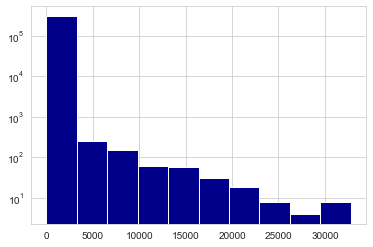

In [8]:
df_import['value'].hist(color='darkblue',log=True)

We use the parameter log to get the view of histogram becuase a lot of data is less than 5000. So, the histogram would be forced to pick up a scale to fit the data and we would get only one bar. This histogram shows the same thing. That most of the data is concentrated below 5000. So, imputation of missing data with mean (which is 39.8) can be misleading since the value can lie anywhere in this region. Also, the outliers have huge value as the scale of the value is in millions of dollars. 

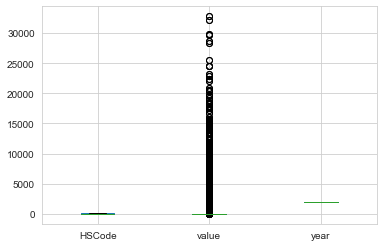

In [9]:
df_import.boxplot()

Similarly, by the box plot, we see that we cannot impute the data using the median as the outliers have great value in comparison.

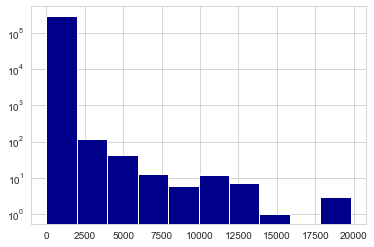

In [10]:
df_export['value'].hist(color='darkblue',log=True)

We get similar trends for export data. Hence, imputing missing values using mean or median can be misleading because such imputation might undermine those coutries whose value for export or import is very high than the mean or median and we might give more importance to the countries whose value for export or import is lower as compared to the mean or median. 

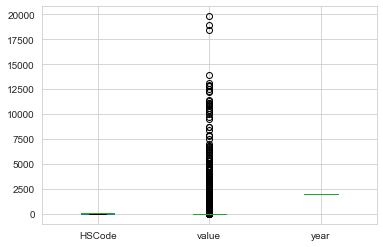

In [11]:
df_export.boxplot()

<h3> Correlation between Variables </h3>

**Correlations between export data variables:**

'Correlation'

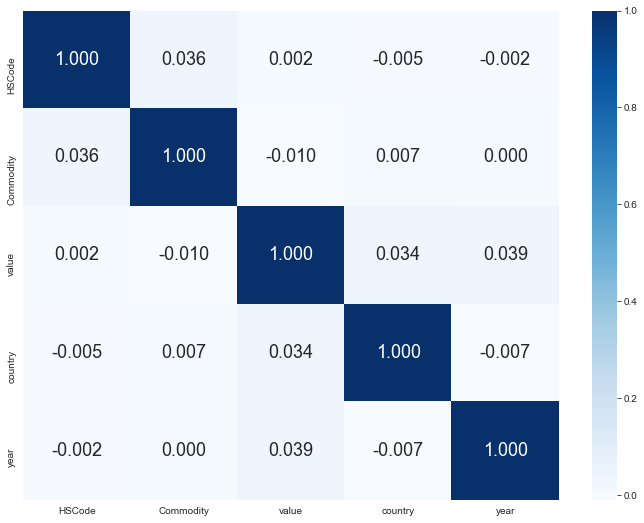

In [12]:
def correlation_matrix(df):
    df['Commodity'] =df['Commodity'].astype('category').cat.codes
    df['year'] =df['year'].astype('category').cat.codes
    df['country'] =df['country'].astype('category').cat.codes
    plt.figure(figsize=(12, 9))
    corr=df.corr()
    # plot the heatmap
    sns.heatmap(corr, 
            xticklabels=corr.columns,
            yticklabels=corr.columns,cmap='Blues',annot=True,annot_kws={"size": 18},fmt='0.3f')
    return "Correlation"
bold('**Correlations between export data variables:**')
display(correlation_matrix(df_export.copy()))

**Correlations between import data variables:**

'Correlation'

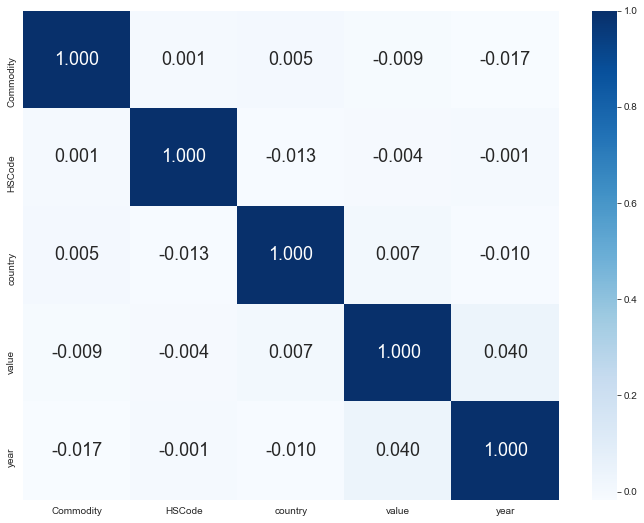

In [13]:
bold('**Correlations between import data variables:**')
display(correlation_matrix(df_import.copy()))

Here we get high correlation between year and value for both import and export which makes sense as with each yeah India's export and import value is also increasing.

<h2> Data Cleaning & Preparation </h2>

In [14]:
def cleanup(data_df):
    #setting country UNSPECIFIED to nan
    #data_df['country']= data_df['country'].apply(lambda x : np.NaN if x == "UNSPECIFIED" else x)
    #ignoring where import value is 0 . 
    data_df = data_df[data_df.value!=0]
    data_df.dropna(inplace=True)
    data_df.drop_duplicates(keep="first",inplace=True)
    data_df.reset_index(inplace=True,drop=True)
    return data_df
df_import=cleanup(df_import)
df_export=cleanup(df_export)
bold('**Variable Description after cleaning of export dataset:**')
display(description(df_export))

bold('**Variable Description after cleaning of import dataset:**')
display(description(df_import))


**Variable Description after cleaning of export dataset:**

,Name,dtypes,Missing,Uniques,Duplicates,First Value,Second Value,Third Value
0,HSCode,int64,0,98,0,6,7,8
1,Commodity,object,0,98,0,LIVE TREES AND OTHER PLANTS; BULBS; ROOTS AND ...,EDIBLE VEGETABLES AND CERTAIN ROOTS AND TUBERS.,EDIBLE FRUIT AND NUTS; PEEL OR CITRUS FRUIT OR...
2,value,float64,0,13634,0,0.02,0.01,0.02
3,country,object,0,248,0,AFGHANISTAN TIS,AFGHANISTAN TIS,AFGHANISTAN TIS
4,year,int64,0,23,0,1997,1997,1997


**Variable Description after cleaning of import dataset:**

,Name,dtypes,Missing,Uniques,Duplicates,First Value,Second Value,Third Value
0,Commodity,object,0,98,0,EDIBLE FRUIT AND NUTS; PEEL OR CITRUS FRUIT OR...,"COFFEE, TEA, MATE AND SPICES.","OIL SEEDS AND OLEA. FRUITS; MISC. GRAINS, SEED..."
1,HSCode,int64,0,98,0,8,9,12
2,country,object,0,245,0,AFGHANISTAN TIS,AFGHANISTAN TIS,AFGHANISTAN TIS
3,value,float64,0,12542,0,7.11,0.6,0.32
4,year,int64,0,23,0,1997,1997,1997


<h2> Feature Engineering </h2>

We have engineered features like "growth rate" for import and export, and "trade deficit" to understand how value of import and export has changed over the years and how the economy is afftected due to this change using "trade deficit".

In [15]:
'''Coverting dataset in year wise'''
exp_year = df_export.groupby('year').agg({'value': 'sum'})
exp_year = exp_year.rename(columns={'value': 'Export'})
imp_year = df_import.groupby('year').agg({'value': 'sum'})
imp_year = imp_year.rename(columns={'value': 'Import'})

'''Calculating the growth of export and import'''
exp_year['Growth Rate(E)'] = exp_year.pct_change()
imp_year['Growth Rate(I)'] = imp_year.pct_change()

'''Calculating trade deficit'''
total_year = pd.concat([exp_year, imp_year], axis = 1)
total_year['Trade Deficit'] = exp_year.Export - imp_year.Import
total_year.replace(np.nan,0,inplace=True)
bold('**Export/Import and Trade Balance of India**')
display(total_year)
bold('**Descriptive statistics**')
display(total_year.describe())

**Export/Import and Trade Balance of India**

,Export,Growth Rate(E),Import,Growth Rate(I),Trade Deficit
year,,,,,
1997,34778.25,0.000000,41480.54,0.000000,-6702.29
1998,33211.36,-0.045054,42384.92,0.021803,-9173.56
1999,36814.50,0.108491,49733.85,0.173385,-12919.35
2000,44551.22,0.210154,50531.81,0.016045,-5980.59
2001,43818.18,-0.016454,51408.59,0.017351,-7590.41
2002,52709.09,0.202905,61407.06,0.194490,-8697.97
2003,63830.68,0.210999,78143.49,0.272549,-14312.81
2004,83523.64,0.308519,111511.57,0.427010,-27987.93
2005,103077.70,0.234114,149159.45,0.337614,-46081.75


**Descriptive statistics**

,Export,Growth Rate(E),Import,Growth Rate(I),Trade Deficit
count,23.000000,23.000000,23.00000,23.000000,23.000000
mean,172248.170435,0.088533,256730.88000,0.104005,-84482.709565
std,111024.591515,0.189750,174264.36611,0.209097,64693.876859
min,33211.360000,-0.517248,41480.54000,-0.520307,-190345.750000
25%,58269.885000,-0.014696,69775.27500,0.001449,-127882.725000
50%,163118.700000,0.100323,251647.74000,0.104167,-88529.040000
75%,288109.795000,0.217883,416188.46000,0.258857,-13616.080000
max,330058.640000,0.397591,514071.33000,0.427010,-5980.590000


<h2> Understanding data trends exports and imports </h2>

In [16]:
'''Visualization of Export/Import and Trade Deficit'''
trace1 = go.Bar(
                x = total_year.index,
                y = total_year.Export,
                name = "Export",
                marker = dict(color = 'rgb(55, 83, 109)',
                             line=dict(color='rgb(0,0,0)',width=1.5)),
                text = total_year.Export)
# create trace2 
trace2 = go.Bar(
                x = total_year.index,
                y = total_year.Import,
                name = "Import",
                marker = dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5)),
                text = total_year.Import)
# create trace3
trace3 = go.Bar(
                x = total_year.index,
                y = total_year['Trade Deficit'],
                name = "Trade Deficit",
                marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5)),
                text = total_year['Trade Deficit'])

layout = go.Layout(hovermode= 'closest', title = 'Export/Import and Trade Deficit of Indian Trade from 2010 to 2018' , xaxis = dict(title = 'Year'), yaxis = dict(title = 'USD (millions)'))
fig = go.Figure(data = [trace1, trace2, trace3], layout = layout)
fig.show()

From the visualization it can be clearly seen that their was a slight dip in Import, Export and Deficit in years 2015 and 2016 and are again Increasing from then. The major reason for this dip can be assumed to be the drop in crude oil prices in those years and after that they again started rising. Since India is a developing country with increasing demands for fuels, this dip in the price of mineral oil significantly changed the country’s trade deficit during those years.

<h2> Trends in Growth Rate </h2>

In [17]:
'''Visualization of Export/Import Growth Rate'''
# create trace1
trace1 = go.Scatter(
                x = total_year.index,
                y = total_year['Growth Rate(E)'],
                name = "Growth Rate(E)",
                line_color='deepskyblue',
                opacity=0.8,
                text = total_year['Growth Rate(E)'])
# create trace2 
trace2 = go.Scatter(
                x = total_year.index,
                y = total_year['Growth Rate(I)'],
                name = "Growth Rate(I)",
                line_color='dimgray',
                opacity=0.8,
                text = total_year['Growth Rate(I)'])

layout = go.Layout(hovermode= 'closest', title = 'Export/Import Growth Rate of Indian Trade from 1997 to 2019' , xaxis = dict(title = 'Year'), yaxis = dict(title = 'Growth Rate'))
fig = go.Figure(data = [trace1, trace2], layout = layout)
fig.show()

<h2> Country based Export Analysis </h2> 

In [19]:
df_export_viz = df_export[['country', 'value', 'year']]
df_export_viz

,country,value,year
0,AFGHANISTAN TIS,0.02,1997
1,AFGHANISTAN TIS,0.01,1997
2,AFGHANISTAN TIS,0.02,1997
3,AFGHANISTAN TIS,1.80,1997
4,AFGHANISTAN TIS,0.34,1997
5,AFGHANISTAN TIS,0.55,1997
6,AFGHANISTAN TIS,0.02,1997
7,AFGHANISTAN TIS,0.01,1997
8,AFGHANISTAN TIS,0.12,1997
9,AFGHANISTAN TIS,0.67,1997


In [18]:
df_export_viz = df_export[['country', 'value', 'year']]
export_desired = df_export_viz.groupby(['country','year']).sum()
export_desired.to_csv("export_desired.csv")
export_viz= pd.read_csv("export_desired.csv")
export_viz

,country,year,value
0,AFGHANISTAN TIS,1997,21.25
1,AFGHANISTAN TIS,1998,12.80
2,AFGHANISTAN TIS,1999,33.16
3,AFGHANISTAN TIS,2000,25.81
4,AFGHANISTAN TIS,2001,24.31
5,AFGHANISTAN TIS,2002,60.73
6,AFGHANISTAN TIS,2003,145.44
7,AFGHANISTAN TIS,2004,165.42
8,AFGHANISTAN TIS,2005,142.58
9,AFGHANISTAN TIS,2006,182.08


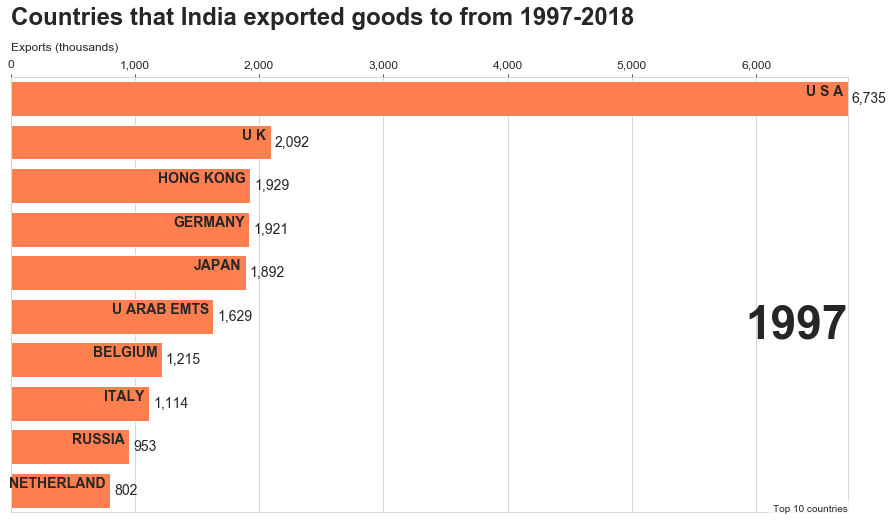

In [16]:
df_export_viz = df_export[['country', 'value', 'year']]
export_desired = df_export_viz.groupby(['country','year']).sum()
export_desired.to_csv("export_desired.csv")
export_viz= pd.read_csv("export_desired.csv")

def draw_barchart(year):
    dff_export = export_viz[export_viz['year'].eq(year)].sort_values(by='value', ascending=True).tail(10)
    ax.clear()
    ax.barh(dff_export['country'], dff_export['value'],color='coral')
    dx_export = dff_export['value'].max() / 200
    for i, (value, country) in enumerate(zip(dff_export['value'], dff_export['country'])):
        ax.text(value-dx_export, i,     country,           size=14, weight=600, ha='right', va='bottom')
        ax.text(value+dx_export, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')
    # ... polished styles
    ax.text(1, 0.4, year, transform=ax.transAxes, size=46, ha='right', weight=800)
    ax.text(0, 1.06, 'Exports (thousands)', transform=ax.transAxes, size=12)
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x',  labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.12, "Countries that India exported goods to from 1997-2018", transform=ax.transAxes, size=24, weight=600, ha='left')
    ax.text(1, 0, 'Top 10 countries', transform=ax.transAxes, ha='right', bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
    #plt.box(False)

    
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart, frames=range(1997, 2018))
HTML(animator.to_jshtml()) 

If we see the graph from 2014 - 2018, we observer that the top 5 countries to which we export are same only their position changes. But the good thing is the presence of our neighours Bangladesh, Nepal, Vietnam, Srilanka in top 10 list, which shows the neighbour first policy of govt has started yielding fruits and their confidence in India is increasing and thus can be assumed that their dependence on china is decreasing which is good from point of geopolitics.
Also US is major importer of Indian goods with highest value of export for almost all years.

<h2> Country based Import Analysis </h2> 

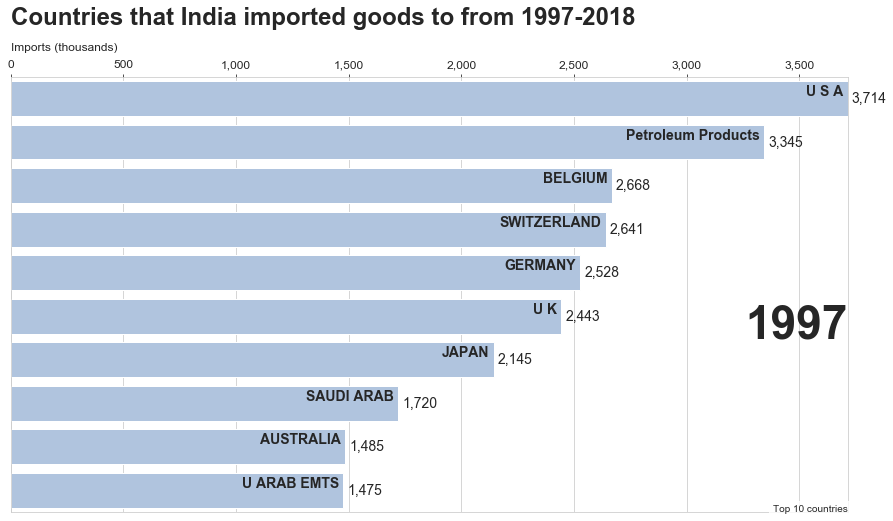

In [17]:
df_import_viz = df_import[['country', 'value', 'year']]
import_temp = df_import_viz.groupby(['country','year']).sum()
import_temp.to_csv("import_temp.csv")
df_import_final_viz=pd.read_csv("import_temp.csv")

def draw_barchart(year):
    dff_import = df_import_final_viz[df_import_final_viz['year'].eq(year)].sort_values(by='value', ascending=True).tail(10)
    ax.clear()
    ax.barh(dff_import['country'], dff_import['value'],color='lightsteelblue')
    dx_import = dff_import['value'].max() / 200
    for i, (value, country) in enumerate(zip(dff_import['value'], dff_import['country'])):
        ax.text(value-dx_import, i,     country,           size=14, weight=600, ha='right', va='bottom')
        ax.text(value+dx_import, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')
    # ... polished styles
    ax.text(1, 0.4, year, transform=ax.transAxes, size=46, ha='right', weight=800)
    ax.text(0, 1.06, 'Imports (thousands)', transform=ax.transAxes, size=12)
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x',  labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.12, "Countries that India imported goods to from 1997-2018", transform=ax.transAxes, size=24, weight=600, ha='left')
    ax.text(1, 0, 'Top 10 countries', transform=ax.transAxes, ha='right', bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))

    
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart, frames=range(1997, 2018))
HTML(animator.to_jshtml()) 

China is the top most country from which India import from 2010 and still the value import is rising.
We can also see the import from other countries is decreasing and India is heavily relying on china for consumption, and this is not a good sign. Also we can observe that since 1997 India has been relying more and more on Asian countries for importing goods while its dependency on European countries has been decreasing with each passing year. 

In [18]:
'''Country export/Import count'''
print('Total number of country Export to:', df_export['country'].nunique())
print('Total number of country Import from:', df_import['country'].nunique())
'''Coverting dataset in Country wise'''
exp_country = df_export.groupby('country').agg({'value':'sum'})
exp_country = exp_country.rename(columns={'value': 'Export'})
exp_country = exp_country.sort_values(by = 'Export', ascending = False)
exp_country = exp_country[:20]

imp_country = df_import.groupby('country').agg({'value':'sum'})
imp_country = imp_country.rename(columns={'value': 'Import'})
imp_country = imp_country.sort_values(by = 'Import', ascending = False)
imp_country = imp_country[:20]

Total number of country Export to: 248
Total number of country Import from: 245


In [19]:
'''Calculating trade deficit'''
total_country = pd.concat([exp_country, imp_country], axis = 1)
total_country['Trade Deficit'] = exp_country.Export - imp_country.Import
total_country = total_country.sort_values(by = 'Trade Deficit', ascending = False)
#total_country = total_country[:11]
print(total_country.shape)
bold('**Direction of Foreign Trade Export/Import and Trade Balance of India**')
display(total_country.head(10))
bold('**Descriptive statistics**')
display(total_country.describe())

(27, 3)


**Direction of Foreign Trade Export/Import and Trade Balance of India**

,Export,Import,Trade Deficit
U S A,561234.19,349848.29,211385.90
U ARAB EMTS,415491.14,354791.85,60699.29
HONG KONG,172679.03,118465.52,54213.51
SINGAPORE,153502.56,126180.14,27322.42
BELGIUM,88346.72,138635.53,-50288.81
MALAYSIA,63056.85,128477.27,-65420.42
JAPAN,80260.27,150999.45,-70739.18
GERMANY,114265.44,191902.34,-77636.90
UNSPECIFIED,75914.42,167362.01,-91447.59
INDONESIA,60408.41,173040.10,-112631.69


**Descriptive statistics**

,Export,Import,Trade Deficit
count,20.000000,20.000000,13.000000
mean,135578.339000,215786.840500,-76202.577692
std,128875.810369,139613.403867,172065.393068
min,59513.730000,118465.520000,-517004.650000
25%,67856.640000,138597.920000,-112631.690000
50%,84303.495000,168596.845000,-70739.180000
75%,139054.455000,217595.272500,27322.420000
max,561234.190000,708223.530000,211385.900000


USA is a country with the highest export values and hence highest trade surplus with India. USA import multiple commodities from India and export a very few (But the few commodities that it export has high value). Overall it seems that we maintain a trade surplus with USA because of export of refined oil to USA. Since the standard for refined oil quality is high for USA country also has to pay more price for the same.

In [20]:
'''Visualization of Export/Import and Trade Deficit'''
trace1 = go.Bar(
                x = total_country.index,
                y = total_country.Export,
                name = "Export",
                marker = dict(color = 'rgb(55, 83, 109)',
                             line=dict(color='rgb(0,0,0)',width=1.5)),
                text = total_year.Export)
# create trace2 
trace2 = go.Bar(
                x = total_country.index,
                y = total_country.Import,
                name = "Import",
                marker = dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5)),
                text = total_year.Import)
# create trace3
trace3 = go.Bar(
                x = total_country.index,
                y = total_country['Trade Deficit'],
                name = "Trade Deficit",
                marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5)),
                text = total_year['Trade Deficit'])

layout = go.Layout(hovermode= 'closest', title = 'Export/Import and Trade Deficit of Indian Trade from 1997 to 2019(Country Wise)' , xaxis = dict(title = 'Country'), yaxis = dict(title = 'USD (millions)'))
fig = go.Figure(data = [trace1, trace2, trace3], layout = layout)
fig.show()

India has highest trade deficit with China as for multiple commodities India only import and export minimal or none to China. China is followed by Saudi Arab due to the coutries heavy consumption of petroleaum products largely due to the increasing number of industries. 
India has highest trade surplus with USA as country being major exporter of many goods to USA

<h3> Total Import in different countries from 1997-2019 </h3>

We try to see the values of the import with respect to the country but also understand it effect by the geographical location. So, that we can see relations with the neighbouring countries etc. To do that, we need to fetch the 3-letter alpha 3 ISO code for the country in the name. However, the names of the country should be an exact match. So, we need to change the countries from capitalize to the title format and then fetch the code for the country.

In [21]:
df=df_import.groupby(['country']).sum()
df['country']=df.index
df['country']=[a.title() for a in df['country']]
input_countries = df['country']
countries = {}
for country in pycountry.countries:
    countries[country.name] = country.alpha_3
df['code'] = [countries.get(country, 'Unknown code') for country in input_countries]
df.to_csv("country1.csv")
df.head()

,HSCode,value,year,country,code
country,,,,,
AFGHANISTAN TIS,15606,3227.10,692865,Afghanistan Tis,Unknown code
ALBANIA,5960,541.85,229429,Albania,ALB
ALGERIA,13555,15192.98,540568,Algeria,DZA
AMERI SAMOA,4892,91.85,150723,Ameri Samoa,Unknown code
ANDORRA,1234,5.71,40172,Andorra,AND


Some of the codes are still unknown code because they have been misspelled while data entry. The mistakes don't follow a pattern so we correct the code in the files by retreiving the code from the list of pycountry.countries. We correct these and the modified file is country.csv

In [1]:
df=pd.read_csv('country.csv')
fig = go.Figure(data=go.Choropleth(
    locations = df['code'],
    z = df['value'],
    text = df['country'],
    colorscale = 'Blues',
    autocolorscale=False,
    reversescale=True,
    marker_line_color='darkgray',
    marker_line_width=0.5,
    colorbar_tickprefix = '$',
    colorbar_title = 'Total Import Value for all the years',
))

fig.update_layout(
    title_text='Import value to all countries from 1997-2019',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'
    ),
    annotations = [dict(
        x=0.55,
        y=0.1,
        xref='paper',
        yref='paper',
        text='Import trends',
        showarrow = False
    )]
)

fig.show()

NameError: name 'pd' is not defined

<h3> Total Export in different countries from 1997-2019 </h3>

Similarly, we try to see the values of the export with respect to the country but also understand it effect by the geographical location. Since, we now already have alpha codes that are needed to plot the map, we can merge them on country name and fetch the code for each of the country.

In [23]:
sd=pd.read_csv('country.csv')
sd=sd[['country','code']]
df=df_export.groupby(['country']).sum()
df['country_name']=df.index
df=df.merge(sd,left_on='country_name',right_on='country')
df.head()

,HSCode,value,year,country_name,country,code
0,72006,7088.36,2892952,AFGHANISTAN TIS,AFGHANISTAN TIS,AFG
1,31269,276.80,1278839,ALBANIA,ALBANIA,ALB
2,68309,11326.63,2816798,ALGERIA,ALGERIA,DZA
3,8516,8.06,302994,AMERI SAMOA,AMERI SAMOA,ASM
4,6128,8.63,204948,ANDORRA,ANDORRA,AND


In [24]:
fig = go.Figure(data=go.Choropleth(
    locations = df['code'],
    z = df['value'],
    text = df['country'],
    colorscale = 'Viridis',
    autocolorscale=False,
    reversescale=True,
    marker_line_color='darkgray',
    marker_line_width=0.5,
    colorbar_tickprefix = '$',
    colorbar_title = 'Total Export Value for all the years',
))

fig.update_layout(
    title_text='Export value to all countries from 1997-2019',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'
    ),
    annotations = [dict(
        x=0.55,
        y=0.1,
        xref='paper',
        yref='paper',
        text='Export trends',
        showarrow = False
    )]
)

fig.show()

In [25]:
df_final_trade = pd.concat([df_export, df_import])
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
plt.rcParams['figure.figsize'] = (15, 15)
wordcloud = WordCloud(background_color = 'white', width = 1200,  height = 1200, max_words = 121).generate(' '.join(df_final_trade['country']))
plt.imshow(wordcloud)
plt.axis('off')
plt.title('Most Popular Country',fontsize = 30)
plt.show()

ModuleNotFoundError: No module named 'wordcloud'

<h2> Commodity Based Export Analysis </h2>

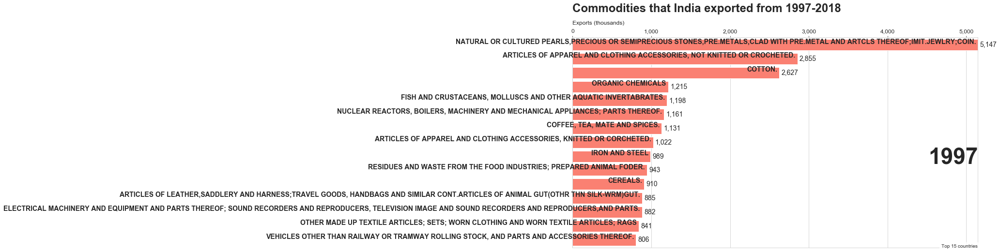

In [26]:
df_comm_export = df_export[['Commodity', 'value', 'year']]
comm_export_temp = df_comm_export.groupby(['Commodity','year']).sum()
comm_export_temp.to_csv("comm_export_temp.csv")
export_comm_viz= pd.read_csv("comm_export_temp.csv")

def draw_barchart(year):
    dff_export = export_comm_viz[export_comm_viz['year'].eq(year)].sort_values(by='value', ascending=True).tail(15)
    ax.clear()
    ax.barh(dff_export['Commodity'], dff_export['value'],color='salmon')
    dx_export = dff_export['value'].max() / 200
    for i, (value, country) in enumerate(zip(dff_export['value'], dff_export['Commodity'])):
        ax.text(value-dx_export, i,     country,           size=14, weight=600, ha='right', va='bottom')
        ax.text(value+dx_export, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')
    # ... polished styles
    ax.text(1, 0.4, year, transform=ax.transAxes, size=46, ha='right', weight=800)
    ax.text(0, 1.06, 'Exports (thousands)', transform=ax.transAxes, size=12)
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x',  labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.12, "Commodities that India exported from 1997-2018", transform=ax.transAxes, size=24, weight=600, ha='left')
    ax.text(1, 0, 'Top 15 countries', transform=ax.transAxes, ha='right', bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))

    
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart, frames=range(1997, 2018))
HTML(animator.to_jshtml()) 

There is a noticeable shift in the export basket, from traditional sectors such as textiles and agricultural commodities. The share of engineering goods has increased significantly along with the increased export of medically important drugs making India the pharmacy of the world. Moreover, with the ever increasing number of engineers in India it is now the world’s back-office because companies from rich nations have outsourced business processes and other IT-intensive and knowledge-based operations to Indian partners. However, the revenues from such services bolster India’s balance of payments, and so do migrants’ remittances, but they do not show up in the merchandise trade statistics.

<h2>Commodity Based Import Analysis</h2>

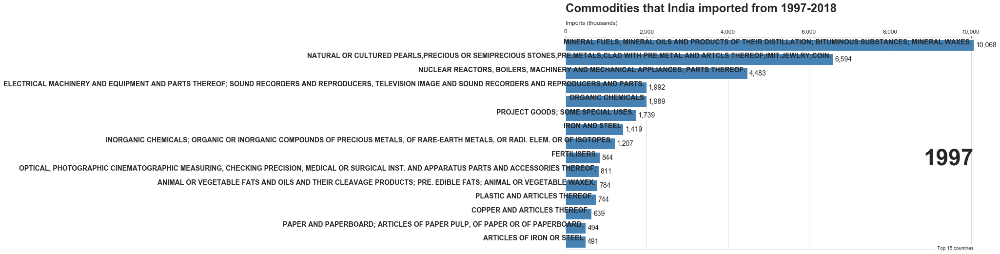

In [27]:
df_comm_import = df_import[['Commodity', 'value', 'year']]
comm_import_temp = df_comm_import.groupby(['Commodity','year']).sum()
comm_import_temp.to_csv("comm_import_temp.csv")
import_comm_viz= pd.read_csv("comm_import_temp.csv")

def draw_barchart(year):
    dff_import = import_comm_viz[import_comm_viz['year'].eq(year)].sort_values(by='value', ascending=True).tail(15)
    ax.clear()
    ax.barh(dff_import['Commodity'], dff_import['value'],color='steelblue')
    dx_import = dff_import['value'].max() / 200
    for i, (value, country) in enumerate(zip(dff_import['value'], dff_import['Commodity'])):
        ax.text(value-dx_import, i,     country,           size=14, weight=600, ha='right', va='bottom')
        ax.text(value+dx_import, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')
    # ... polished styles
    ax.text(1, 0.4, year, transform=ax.transAxes, size=46, ha='right', weight=800)
    ax.text(0, 1.06, 'Imports (thousands)', transform=ax.transAxes, size=12)
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x',  labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.12, "Commodities that India imported from 1997-2018", transform=ax.transAxes, size=24, weight=600, ha='left')
    ax.text(1, 0, 'Top 15 countries', transform=ax.transAxes, ha='right', bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))

    
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart, frames=range(1997, 2018))
HTML(animator.to_jshtml()) 

India is the major importer of Petroleum products and Jewelary and Gem stones and pattern has remaind almost consistent for these two categories over the years. However, the value of Petroleum products has been increasing over the years. Also there is significant decrease in the value of "Iron and steel" prodcuts and "Fertilizers" while values of "Spacecraft parts" and "Sound recorder and reproduces and parts" has been increasing.

In [28]:
df = df_import[df_import['country']== 'VENEZUELA']
df_ven = df[df['year'] > 2000]
data = df_ven[df_ven['HSCode'] ==  27]  #HSCode 27 corresponding to Mineral Fuels
data

,Commodity,HSCode,country,value,year
44765,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,VENEZUELA,714.12,2006
50389,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,VENEZUELA,382.36,2007
56056,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,VENEZUELA,4209.71,2008
61715,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,VENEZUELA,2847.89,2009
67961,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,VENEZUELA,5203.69,2010
74358,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,VENEZUELA,6653.12,2011
80350,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,VENEZUELA,14105.91,2012
86269,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,VENEZUELA,13936.59,2013
92227,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,VENEZUELA,11669.14,2014
98225,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,VENEZUELA,5678.63,2015


<h2> Section Based Analysis </h2>

Each HS code is assigned a section to which the product belongs. Fetching that and constructing a feature Section allows us to interpret the section to which the commodity belongs.

In [29]:
''' creating a new dataframe on Sections of HSCode'''
HSCode = pd.DataFrame() 
HSCode['Start']=[1,6,15,16,25,28,39,41,44,47,50,64,68,71,72,84,86,90,93,94,97]
HSCode['End']=[5,14,15,24,27,38,40,43,46,49,63,67,70,71,83,85,89,92,93,96,99]
HSCode['Sections Name']=['Animals & Animal Products',
'Vegetable Products',
'Animal Or Vegetable Fats',
'Prepared Foodstuffs',
'Mineral Products',
'Chemical Products',
'Plastics & Rubber',
'Hides & Skins',
'Wood & Wood Products',
'Wood Pulp Products',
'Textiles & Textile Articles',
'Footwear, Headgear',
'Articles Of Stone, Plaster, Cement, Asbestos',
'Pearls, Precious Or Semi-Precious Stones, Metals',
'Base Metals & Articles Thereof',
'Machinery & Mechanical Appliances',
'Transportation Equipment',
'Instruments - Measuring, Musical',
'Arms & Ammunition',
'Miscellaneous',
'Works Of Art',]
HSCode.index += 1
HSCode.index.name = 'Section'
bold('**List of indian HS Classification is based on the HS Code:**')
display(HSCode)

**List of indian HS Classification is based on the HS Code:**

,Start,End,Sections Name
Section,,,
1,1,5,Animals & Animal Products
2,6,14,Vegetable Products
3,15,15,Animal Or Vegetable Fats
4,16,24,Prepared Foodstuffs
5,25,27,Mineral Products
6,28,38,Chemical Products
7,39,40,Plastics & Rubber
8,41,43,Hides & Skins
9,44,46,Wood & Wood Products


In [30]:
df_export['Sections Name'] = df_export['HSCode']
df_import['Sections Name'] = df_import['HSCode']
for i in range(1,22):
    df_export.loc[(df_export['Sections Name'] >= HSCode['Start'][i]) & (df_export['Sections Name'] <= HSCode['End'][i]),'Sections Name']=i
    df_import.loc[(df_import['Sections Name'] >= HSCode['Start'][i]) & (df_import['Sections Name'] <= HSCode['End'][i]),'Sections Name']=i
exp_hscode = df_export.groupby(['Sections Name']).agg({'value':'sum'})
exp_hscode['Sections Name'] = HSCode['Sections Name']
imp_hscode = df_import.groupby(['Sections Name']).agg({'value':'sum'})
imp_hscode['Sections Name'] = HSCode['Sections Name']

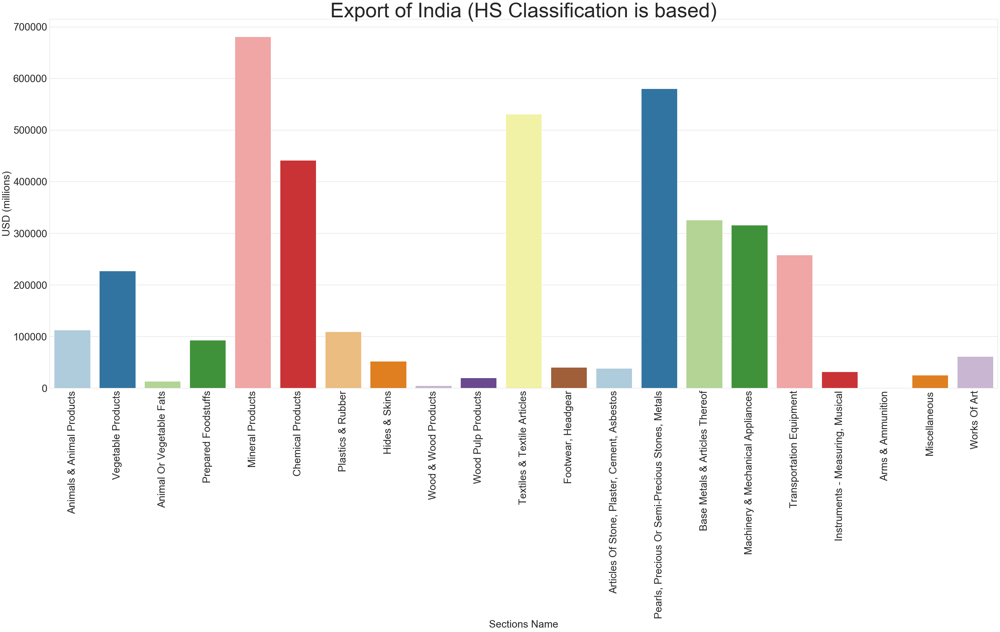

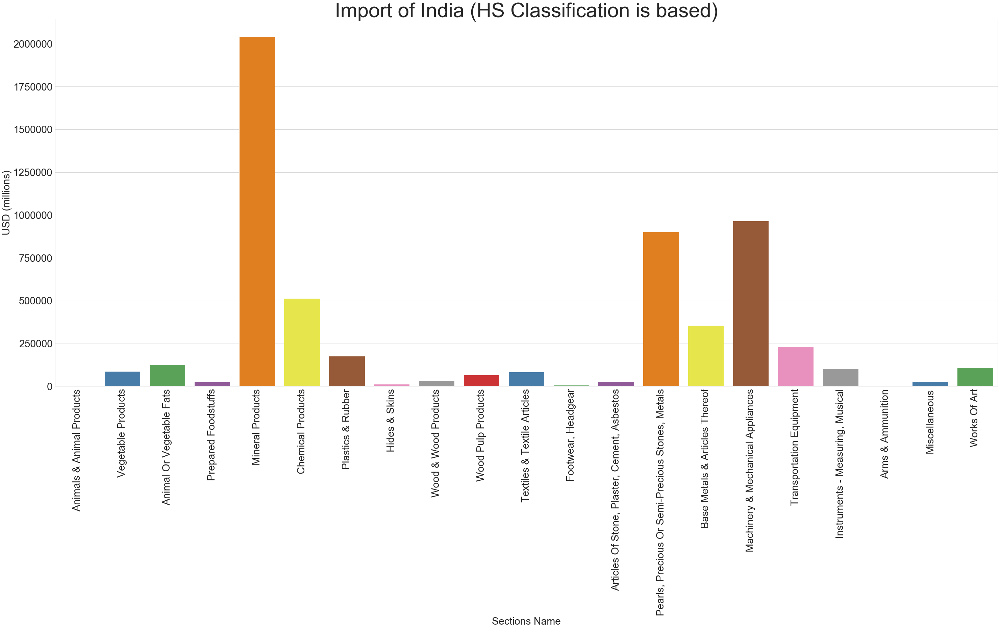

In [31]:
'''Visualization of Export/Import HS Classification is based'''
def bar_plot(x,y, xlabel, ylabel, label, color):
    global ax
    font_size = 30
    title_size = 60
    plt.rcParams['figure.figsize'] = (50, 20)
    ax = sns.barplot(x, y, palette = color)
    ax.set_xlabel(xlabel = xlabel, fontsize = font_size)
    ax.set_ylabel(ylabel = ylabel, fontsize = font_size)
    ax.set_title(label = label, fontsize = title_size)
    plt.xticks(rotation = 90, fontsize=30)
    plt.yticks(fontsize=30)
    plt.show()

bar_plot(exp_hscode['Sections Name'], exp_hscode.value, 'Sections Name', 'USD (millions)', 'Export of India (HS Classification is based)', 'Paired')
bar_plot(imp_hscode['Sections Name'], imp_hscode.value, 'Sections Name', 'USD (millions)', 'Import of India (HS Classification is based)', 'Set1')

<h2>External Market Analysis Converging with Data

<h3>Case-1 Venezuela

India was mostly dependent on Middle East Countries for it’s requirements of Crude Oil, but as India signed a deal with Venezuela and as India gained the ability of refining Venezuela’s inferior oil quality (ONGC refining) in the year 2010, India was Venezuela highest Asian Importer of Crude oil. This observation was found when Venezuela entered in the list of “Top Importers for India” in the animation provided above.

In [32]:
df_external_analysis_import = pd.read_csv("import_temp.csv")
df_intermediate = df_external_analysis_import[df_external_analysis_import['country']== 'VENEZUELA']
df_intermediate

,country,year,value
4505,VENEZUELA,1997,6.77
4506,VENEZUELA,1998,6.59
4507,VENEZUELA,1999,2.55
4508,VENEZUELA,2000,14.44
4509,VENEZUELA,2001,2.59
4510,VENEZUELA,2002,3.72
4511,VENEZUELA,2003,2.51
4512,VENEZUELA,2004,4.01
4513,VENEZUELA,2005,9.54
4514,VENEZUELA,2006,748.90


We can observe that the imports increased heavily after the year 2008, thus we see the major contributors for the increase below. We observe that the commodity influencing the increased imports is indeed "Mineral Fuels".

In [33]:
df_venen_analysis = pd.read_csv("all_import.csv")
df_venen_analysis = df_venen_analysis[df_venen_analysis['country']== 'VENEZUELA']
df_venen_analysis = df_venen_analysis[df_venen_analysis['year'] > 2007]

In [34]:
df_venen_analysis = df_venen_analysis.sort_values('value', ascending = 0)
df_venen_analysis[0:20]

,Unnamed: 0,Commodity,HSCode,Unnamed: 0.1,country,value,year
117258,3,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,NaN,VENEZUELA,14105.91,2012
297498,117258,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,3.0,VENEZUELA,14105.91,2012
305700,125460,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,2.0,VENEZUELA,13936.59,2013
125460,2,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,NaN,VENEZUELA,13936.59,2013
313886,133646,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,3.0,VENEZUELA,11669.14,2014
133646,3,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,NaN,VENEZUELA,11669.14,2014
347297,167057,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,4.0,VENEZUELA,7248.15,2018
167057,4,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,NaN,VENEZUELA,7248.15,2018
289026,108786,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,4.0,VENEZUELA,6653.12,2011
108786,4,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,NaN,VENEZUELA,6653.12,2011


<h3> Case-2 The interesting tale of Nigeria

In a recent statement, by the oil-rich Nigerian Government, it stated that India has replaced the United States as its largest crude importer, as it covered 20–25 percentof India’s domestic oil demand. This is quite evident from the data. But the interest-ing fact is that highest exported goods to Nigeria are ”VEHICLES OTHER THANRAILWAY OR TRAMWAY ROLLING” which includes vehicles for drilling, carry-ing goods, etc. An external analysis of led us to the fact that Nigeria allowed Indian companies to set up petroleum plants. We can infer that the required tools (drilling and heavy vehicles) were exported to Nigeria.

In [35]:
df_nigeria_analysis = pd.read_csv("all_import.csv")
df_nigeria_analysis = df_nigeria_analysis[df_nigeria_analysis['country']== 'NIGERIA']
#df_nigeria_analysis = df_nigeria_analysis[df_nigeria_analysis['year'] > 2007]
df_nigeria = df_nigeria_analysis[df_nigeria_analysis['value'] == df_nigeria_analysis['value'].max()]
df_nigeria

,Unnamed: 0,Commodity,HSCode,Unnamed: 0.1,country,value,year
105703,16,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,NaN,NIGERIA,14621.44,2011
285943,105703,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,16.0,NIGERIA,14621.44,2011


In [36]:
df_nigeria_analysis = df_nigeria_analysis[df_nigeria_analysis['HSCode']== 27]
df_nigeria_analysis

,Unnamed: 0,Commodity,HSCode,Unnamed: 0.1,country,value,year
2727,5,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,NaN,NIGERIA,1047.05,1997
7379,5,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,NaN,NIGERIA,1047.05,1997
13792,7,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,NaN,NIGERIA,1109.16,1998
18988,9,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,NaN,NIGERIA,2868.19,1999
24637,12,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,NaN,NIGERIA,0.03,2000
30584,11,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,NaN,NIGERIA,NaN,2001
65414,9,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,NaN,NIGERIA,6929.90,2006
73327,11,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,NaN,NIGERIA,7504.51,2007
81237,10,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,NaN,NIGERIA,8818.14,2008
89139,12,"MINERAL FUELS, MINERAL OILS AND PRODUCTS OF TH...",27,NaN,NIGERIA,7201.29,2009


<h3> What does India exports the most to Nigeria?

In [37]:
df_nigeria_analysis_1 = pd.read_csv("india_export.csv")
df_nigeria_analysis_1 = df_nigeria_analysis_1[df_nigeria_analysis_1['country']== 'NIGERIA']
#df_nigeria_analysis = df_nigeria_analysis[df_nigeria_analysis['year'] > 2007]
df_nigeria_1 = df_nigeria_analysis_1[df_nigeria_analysis_1['value'] == df_nigeria_analysis_1['value'].max()]
df_nigeria_1

,HSCode,Commodity,value,country,year
244248,87,VEHICLES OTHER THAN RAILWAY OR TRAMWAY ROLLING...,500.68,NIGERIA,2014


In [38]:
df_nigeria_analysis_1 = df_nigeria_analysis_1[df_nigeria_analysis_1['HSCode']== 87]
df_nigeria_analysis_1

,HSCode,Commodity,value,country,year
6424,87,VEHICLES OTHER THAN RAILWAY OR TRAMWAY ROLLING...,43.32,NIGERIA,1997
14982,87,VEHICLES OTHER THAN RAILWAY OR TRAMWAY ROLLING...,43.32,NIGERIA,1997
25605,87,VEHICLES OTHER THAN RAILWAY OR TRAMWAY ROLLING...,19.61,NIGERIA,1998
36692,87,VEHICLES OTHER THAN RAILWAY OR TRAMWAY ROLLING...,20.63,NIGERIA,1999
48174,87,VEHICLES OTHER THAN RAILWAY OR TRAMWAY ROLLING...,39.34,NIGERIA,2000
60018,87,VEHICLES OTHER THAN RAILWAY OR TRAMWAY ROLLING...,50.61,NIGERIA,2001
72231,87,VEHICLES OTHER THAN RAILWAY OR TRAMWAY ROLLING...,31.89,NIGERIA,2002
85145,87,VEHICLES OTHER THAN RAILWAY OR TRAMWAY ROLLING...,45.39,NIGERIA,2003
98625,87,VEHICLES OTHER THAN RAILWAY OR TRAMWAY ROLLING...,31.23,NIGERIA,2004
112323,87,VEHICLES OTHER THAN RAILWAY OR TRAMWAY ROLLING...,31.06,NIGERIA,2005


Nigeria has actively encouraged Indian companies to invest and expand Nigeria's mining and development of coal, gold, iron ore, chrome ore, lead and other mineral resources. The vehicles that come under the HSCode 87 are: Machinery Vehicles used for Drilling, Carrying Heavy Loads, etc.